In [14]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/kermany2018/OCT2017 /val/DRUSEN/DRUSEN-9861332-1.jpeg
/kaggle/input/kermany2018/OCT2017 /val/DRUSEN/DRUSEN-9894035-2.jpeg
/kaggle/input/kermany2018/OCT2017 /val/DRUSEN/DRUSEN-9884539-2.jpeg
/kaggle/input/kermany2018/OCT2017 /val/DRUSEN/DRUSEN-9894035-1.jpeg
/kaggle/input/kermany2018/OCT2017 /val/DRUSEN/DRUSEN-9837663-1.jpeg
/kaggle/input/kermany2018/OCT2017 /val/DRUSEN/DRUSEN-9800172-2.jpeg
/kaggle/input/kermany2018/OCT2017 /val/DRUSEN/DRUSEN-9884539-1.jpeg
/kaggle/input/kermany2018/OCT2017 /val/DRUSEN/DRUSEN-9928043-1.jpeg
/kaggle/input/kermany2018/OCT2017 /val/CNV/CNV-6294785-1.jpeg
/kaggle/input/kermany2018/OCT2017 /val/CNV/CNV-8598714-1.jpeg
/kaggle/input/kermany2018/OCT2017 /val/CNV/CNV-6668596-1.jpeg
/kaggle/input/kermany2018/OCT2017 /val/CNV/CNV-6294785-2.jpeg
/kaggle/input/kermany2018/OCT2017 /val/CNV/CNV-6652117-1.jpeg
/kaggle/input/kermany2018/OCT2017 /val/CNV/CNV-6875371-1.jpeg
/kaggle/input/kermany2018/OCT2017 /val/CNV/CNV-8184974-1.jpeg
/kaggle/input/kermany2

In [2]:
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense,Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications import ResNet50 
from keras.applications.vgg16 import VGG16

In [3]:
model=keras.applications.ResNet50(
    include_top=True,
    weights=None,
    input_tensor=None,
    input_shape=(224, 224, 3),
    pooling=None,
    classes=4,
    classifier_activation="softmax",
)

In [5]:
model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,595,908 (90.01 MB)

 Trainable params: 23,542,788 (89.81 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [4]:
val_ds=keras.utils.image_dataset_from_directory(
    directory="/kaggle/input/kermany2018/OCT2017 /test",
    labels="inferred",
    label_mode="categorical",
    batch_size=32,
    image_size=(224, 224)
)
train_ds=keras.utils.image_dataset_from_directory(
    directory="/kaggle/input/kermany2018/OCT2017 /train",
    labels="inferred",
    label_mode="categorical",
    batch_size=32,
    image_size=(224, 224)
)

Found 968 files belonging to 4 classes.
Found 83484 files belonging to 4 classes.


In [5]:
def process(image, label):
    image = tf.cast(image / 255., tf.float32)
    # No need to one-hot encode the labels for sparse_categorical_crossentropy
    return image, label

# Assuming train_ds and validation_ds are already defined TensorFlow Dataset objects
train_ds = train_ds.map(process)
val_ds = val_ds.map(process)

In [9]:
val_ds


<_MapDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 4), dtype=tf.float32, name=None))>

In [6]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy', # Use categorical_crossentropy for one-hot encoded labels
              metrics=['accuracy'])

In [7]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Define your callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-7)
checkpoint = ModelCheckpoint('InceptionV3_tuning.keras',
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True,
                             mode='auto')

# Assuming 'model' is your Keras model and you have defined your training and validation data


In [8]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=20,  # Or however many epochs you wish to train for
    callbacks=[early_stopping, reduce_lr, checkpoint]
)

Epoch 1/20


I0000 00:00:1721885998.798938      81 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1721885998.896918      81 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


2609/2609 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7937 - loss: 0.6432

W0000 00:00:1721886420.422369      83 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1721886424.755702      82 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update



Epoch 1: val_loss improved from inf to 0.33417, saving model to InceptionV3_tuning.keras
2609/2609 ━━━━━━━━━━━━━━━━━━━━ 503s 166ms/step - accuracy: 0.7937 - loss: 0.6431 - val_accuracy: 0.8967 - val_loss: 0.3342 - learning_rate: 0.0010
Epoch 2/20
2609/2609 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.9235 - loss: 0.2353
Epoch 2: val_loss did not improve from 0.33417
2609/2609 ━━━━━━━━━━━━━━━━━━━━ 393s 151ms/step - accuracy: 0.9235 - loss: 0.2353 - val_accuracy: 0.4421 - val_loss: 3.1794 - learning_rate: 0.0010
Epoch 3/20
2609/2609 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.9346 - loss: 0.1980
Epoch 3: val_loss improved from 0.33417 to 0.15619, saving model to InceptionV3_tuning.keras
2609/2609 ━━━━━━━━━━━━━━━━━━━━ 395s 151ms/step - accuracy: 0.9346 - loss: 0.1980 - val_accuracy: 0.9421 - val_loss: 0.1562 - learning_rate: 0.0010
Epoch 4/20
2609/2609 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.9431 - loss: 0.1694
Epoch 4: val_loss improved from 0.15619 to 0.07750, saving 

In [13]:
model.save('my_model.h5')

In [14]:
import pickle

# Convert the history.history dict to a pickle file
with open('training_history.pkl', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

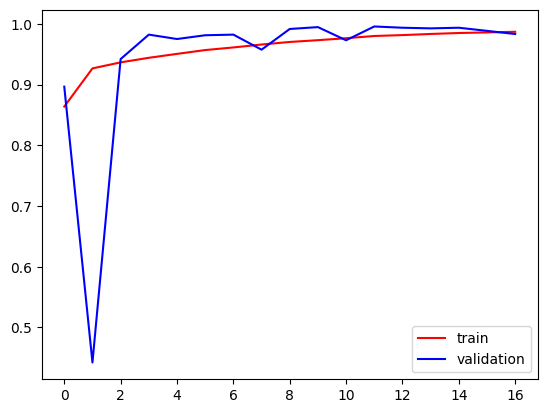

In [9]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'],color='red',label='train')
plt.plot(history.history['val_accuracy'],color='blue',label='validation')
plt.legend()
plt.show()

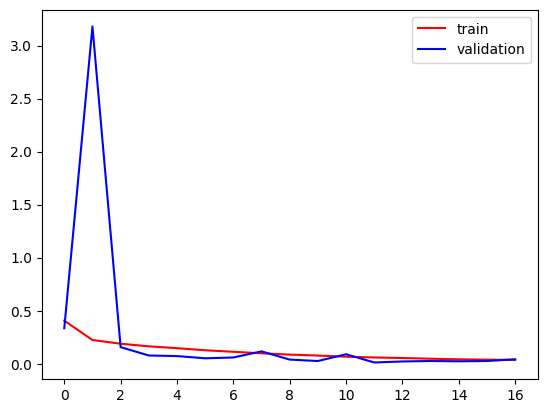

In [11]:
plt.plot(history.history['loss'],color='red',label='train')
plt.plot(history.history['val_loss'],color='blue',label='validation')
plt.legend()
plt.show()

In [12]:
import plotly.graph_objects as go

# Create traces for the training and validation loss
trace1 = go.Scatter(
    y=history.history['loss'],
    mode='lines',
    name='train',
    line=dict(color='red'),
)

trace2 = go.Scatter(
    y=history.history['val_loss'],
    mode='lines',
    name='validation',
    line=dict(color='blue'),
)

# Create the figure and add traces
fig = go.Figure()
fig.add_trace(trace1)
fig.add_trace(trace2)

# Update the layout
fig.update_layout(
    title='Training and Validation Loss',
    xaxis_title='Epoch',
    yaxis_title='Loss',
    legend_title='Type'
)

# Show the figure
fig.show()